# Photo embeddings & hybrid retrieval (CLIP + caption text + Qdrant)

Goal: enrich the Yelp assistant with **photos**, the way real Yelp listings do — and let the agent retrieve photos by **both** caption text *and* visual content.

Caption-only matching fails when captions are missing, too short, or phrased differently than the user's question. Image-only matching can miss literal terms a user expects (specific menu items, named amenities like "heaters"). Production photo search systems sidestep this with **hybrid retrieval**: rank with both signals and fuse the rankings.

We mirror that here. Each photo gets **two named vectors** in Qdrant:

| Named vector   | Encoder                        | Dim   | Captures                      |
|----------------|--------------------------------|-------|-------------------------------|
| `caption_text` | OpenAI `text-embedding-3-small`| 1536  | literal terms in the caption  |
| `image_clip`   | `clip-ViT-B-32`                | 512   | visual content of the image   |

At query time the user's question is encoded with **both** models in parallel and Qdrant fuses the two rankings via **Reciprocal Rank Fusion** (`FusionQuery(fusion="rrf")`) — the same pattern the reviews tool already uses.

Pipeline:

1. Load the photo metadata sample (`data/raw/photos_restaurants_sample.json`).
2. For each photo, build:
   - a *caption text* string (`"{label}: {caption}"`, or just `label` if no caption),
   - the OpenAI 1536-d text embedding of that string,
   - the CLIP 512-d image embedding of the photo file.
3. Upsert into `yelp-photos-collection-00` with both vectors and payload `{business_id, photo_id, caption, label}`.
4. Run text-only / image-only / hybrid queries side by side so we can see the fusion in action.

In [1]:
import json
import math
import os
import random
from pathlib import Path
from uuid import uuid5, NAMESPACE_URL

import pandas as pd
import torch
from PIL import Image
from tqdm.auto import tqdm

import matplotlib.pyplot as plt

import openai
from sentence_transformers import SentenceTransformer
from qdrant_client import QdrantClient
from qdrant_client.models import (
    VectorParams,
    Distance,
    PointStruct,
    Filter,
    FieldCondition,
    MatchAny,
    Prefetch,
    FusionQuery,
)

from dotenv import load_dotenv
load_dotenv("../.env")  # OPENAI_API_KEY for the text-embedding side

/Users/wilfriedtcheumaha/Code/yelp-assistant/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


True

In [2]:
DATA_DIR = Path("../data/raw")
PHOTOS_JSONL = DATA_DIR / "photos_restaurants_sample.json"
PHOTOS_DIR = DATA_DIR / "photos"

QDRANT_URL = "http://localhost:6333"
QDRANT_COLLECTION = "yelp-photos-collection-00"

# Vector A: literal caption text — same OpenAI model the reviews tool already uses.
TEXT_EMBED_MODEL = "text-embedding-3-small"
TEXT_EMBED_DIM = 1536

# Vector B: image content — CLIP ViT-B/32 via sentence-transformers.
CLIP_MODEL_NAME = "clip-ViT-B-32"
CLIP_DIM = 512

# Named vectors inside the Qdrant collection — must match what tools.py queries.
VECTOR_NAME_TEXT = "caption_text"
VECTOR_NAME_IMAGE = "image_clip"

# Cap how many photos we embed in the notebook so the first run is fast.
# Bump this (or set to None) once you've verified the pipeline end-to-end.
MAX_PHOTOS = 800
CLIP_BATCH = 32
TEXT_BATCH = 64  # OpenAI lets us batch many short strings into one call

# Pick the best available device on this host (notebook runs on macOS host, not in the linux container).
if torch.backends.mps.is_available():
    DEVICE = "mps"
elif torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"

# OpenAI client; reads OPENAI_API_KEY from .env.
openai_client = openai.OpenAI()

print("Device:", DEVICE)
print("Photos jsonl :", PHOTOS_JSONL.resolve())
print("Photos dir   :", PHOTOS_DIR.resolve())
print("Qdrant URL   :", QDRANT_URL)
print("Text vector  :", f"{TEXT_EMBED_MODEL} ({TEXT_EMBED_DIM}-d, named '{VECTOR_NAME_TEXT}')")
print("Image vector :", f"{CLIP_MODEL_NAME} ({CLIP_DIM}-d, named '{VECTOR_NAME_IMAGE}')")

Device: mps
Photos jsonl : /Users/wilfriedtcheumaha/Code/yelp-assistant/data/raw/photos_restaurants_sample.json
Photos dir   : /Users/wilfriedtcheumaha/Code/yelp-assistant/data/raw/photos
Qdrant URL   : http://localhost:6333
Text vector  : text-embedding-3-small (1536-d, named 'caption_text')
Image vector : clip-ViT-B-32 (512-d, named 'image_clip')


## 1. Load and inspect the photo metadata

Each line of `photos_restaurants_sample.json` is a single photo: `{photo_id, business_id, caption, label}` where `label ∈ {food, drink, inside, outside, menu}`. The image bytes themselves live at `data/raw/photos/<photo_id>.jpg`.

In [3]:
def load_photos_metadata(path: Path) -> pd.DataFrame:
    rows = []
    with path.open() as f:
        for line in f:
            line = line.strip()
            if line:
                rows.append(json.loads(line))
    df = pd.DataFrame(rows)
    df["image_path"] = df["photo_id"].map(lambda pid: PHOTOS_DIR / f"{pid}.jpg")
    df["image_exists"] = df["image_path"].map(lambda p: p.exists())
    return df

photos_df = load_photos_metadata(PHOTOS_JSONL)

print(f"Total rows         : {len(photos_df):,}")
print(f"Distinct businesses: {photos_df['business_id'].nunique():,}")
print(f"Image files present: {int(photos_df['image_exists'].sum()):,} / {len(photos_df):,}")
photos_df.head(5)

Total rows         : 3,731
Distinct businesses: 640
Image files present: 3,731 / 3,731


,photo_id,business_id,caption,label,image_path,image_exists
0,J1rqVl8pAoMJtPfGA2HV9w,jkGQQ4_LgJx3hwPtCFkzbQ,,outside,../data/raw/photos/J1rqVl8pAoMJtPfGA2HV9w.jpg,True
1,UEwMittQNRLc9956JjphpQ,5zqvErekexa_89W6-6uZ4g,Comfy booths and chairs,inside,../data/raw/photos/UEwMittQNRLc9956JjphpQ.jpg,True
2,fWq21Bfj89geWTcaCyFMHQ,B14QVaV7ohfMmHldumd5aw,Hamburger pizza.,food,../data/raw/photos/fWq21Bfj89geWTcaCyFMHQ.jpg,True
3,PjHN7jZsFz1XzZagvExKWA,q1LlkxzJ1VEzKedgPrcDlw,,food,../data/raw/photos/PjHN7jZsFz1XzZagvExKWA.jpg,True
4,919jq1Q_goCSf7zZoXeQ1A,-IQsXtexaUmIfSBkhBZrKQ,,food,../data/raw/photos/919jq1Q_goCSf7zZoXeQ1A.jpg,True


In [4]:
print("Label distribution:")
print(photos_df["label"].value_counts())

print("\nPhotos per business — top 5:")
print(photos_df["business_id"].value_counts().head(5))

print("\nPhotos per business — distribution:")
print(photos_df["business_id"].value_counts().describe().round(2))

Label distribution:
label
food       2190
inside      959
outside     330
drink       216
menu         36
Name: count, dtype: int64

Photos per business — top 5:
business_id
GXFMD0Z4jEVZBCsbPf4CTQ    131
oBNrLz4EDhiscSlbOl8uAw    110
-mIlmp5l4hKlp1tvHRdvTg     78
uR7G8I4Cef9D9R340TN24Q     57
ifMu8oaLD0_Roi7r8G4x9w     46
Name: count, dtype: int64

Photos per business — distribution:
count    640.00
mean       5.83
std        9.41
min        1.00
25%        2.00
50%        3.00
75%        7.00
max      131.00
Name: count, dtype: float64


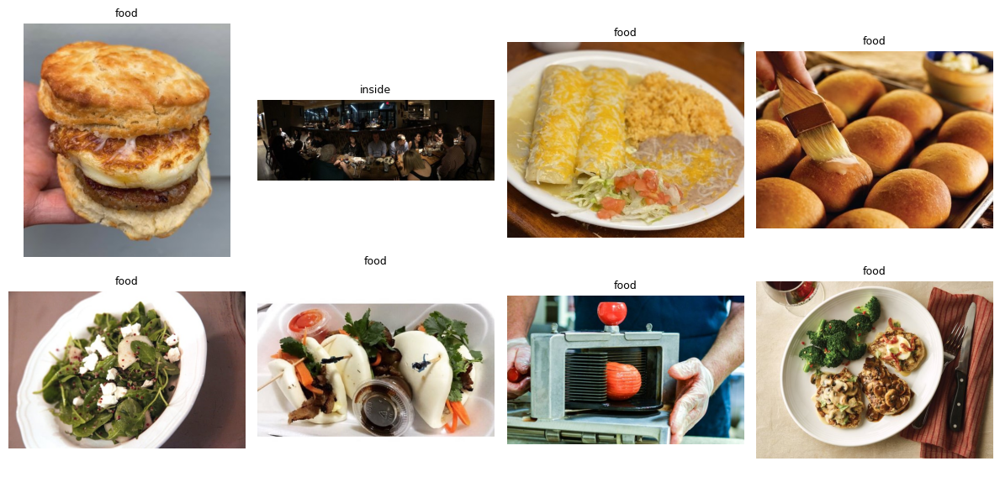

In [5]:
def show_image_grid(rows, cols: int = 4, title_field: str = "label", figsize_per: float = 3.0):
    """Render a list of dict-like rows (each with at least `image_path`) as a thumbnail grid."""
    rows = list(rows)
    n = len(rows)
    if n == 0:
        print("No rows to display.")
        return
    n_cols = min(cols, n)
    n_rows = math.ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(figsize_per * n_cols, figsize_per * n_rows))
    axes = [axes] if n == 1 else (axes.flatten() if hasattr(axes, "flatten") else axes)
    for ax, row in zip(axes, rows):
        try:
            img = Image.open(row["image_path"]).convert("RGB")
            ax.imshow(img)
        except Exception as e:
            ax.text(0.5, 0.5, f"missing\n{e.__class__.__name__}", ha="center", va="center")
        title_bits = [str(row.get(title_field, ""))]
        if "score" in row:
            title_bits.append(f"score={row['score']:.3f}")
        ax.set_title("  ".join(b for b in title_bits if b), fontsize=9)
        ax.axis("off")
    for ax in axes[n:]:
        ax.axis("off")
    plt.tight_layout()
    plt.show()

# Quick sanity check: show 8 random photos that actually exist on disk.
sample = photos_df[photos_df["image_exists"]].sample(min(8, photos_df["image_exists"].sum()), random_state=0)
show_image_grid(sample.to_dict("records"), cols=4)

## 2. Encoders — CLIP for images, OpenAI for caption text

Two encoders, one per named vector:

- **`clip-ViT-B-32`** — encodes images *and* text into a shared 512-d space. We L2-normalise so cosine and inner-product agree.
- **`text-embedding-3-small`** — OpenAI's text embedding (1536-d). Already used by the reviews tool, so the production API client stays warm.

Indexed text per photo:
```
captioned       →  "{label}: {caption}"           e.g. "outside: heated patio with string lights"
no caption      →  "{label}"                      e.g. "food"
```
Keeping the label as a prefix gives short captions some baseline semantics and gives caption-less photos *something* to embed.

In [6]:
clip_model = SentenceTransformer(CLIP_MODEL_NAME, device=DEVICE)
print("Loaded:", CLIP_MODEL_NAME, "on", DEVICE)


def caption_text_for(row) -> str:
    """The string we feed to OpenAI's text encoder for a single photo row."""
    label = (row.get("label") or "").strip()
    caption = (row.get("caption") or "").strip()
    if caption:
        return f"{label}: {caption}" if label else caption
    return label or "photo"


def embed_images_clip(image_paths, batch_size: int = CLIP_BATCH):
    """Embed image paths into L2-normalised 512-d CLIP vectors. Skips files we fail to open."""
    vectors, kept_paths = [], []
    pending_paths, pending_imgs = [], []

    def flush():
        if not pending_imgs:
            return
        v = clip_model.encode(
            pending_imgs,
            batch_size=batch_size,
            convert_to_numpy=True,
            normalize_embeddings=True,
            show_progress_bar=False,
        )
        vectors.extend(v)
        kept_paths.extend(pending_paths)
        for img in pending_imgs:
            img.close()
        pending_imgs.clear()
        pending_paths.clear()

    for p in image_paths:
        try:
            pending_imgs.append(Image.open(p).convert("RGB"))
            pending_paths.append(p)
        except Exception as e:
            print(f"skip {p}: {e}")
            continue
        if len(pending_imgs) >= batch_size:
            flush()
    flush()
    return vectors, kept_paths


def embed_texts_openai(texts, batch_size: int = TEXT_BATCH):
    """Embed a list of strings with OpenAI text-embedding-3-small. Returns list of 1536-d vectors."""
    vectors = []
    for i in range(0, len(texts), batch_size):
        chunk = texts[i:i + batch_size]
        # OpenAI doesn't allow empty strings; substitute "photo" so every photo has *some* vector.
        chunk = [t if t.strip() else "photo" for t in chunk]
        resp = openai_client.embeddings.create(input=chunk, model=TEXT_EMBED_MODEL)
        vectors.extend(item.embedding for item in resp.data)
    return vectors


def embed_clip_text(query: str):
    """Encode a single query into the 512-d CLIP text/image space."""
    return clip_model.encode(
        [query],
        convert_to_numpy=True,
        normalize_embeddings=True,
        show_progress_bar=False,
    )[0]


def embed_openai_text(query: str):
    """Encode a single query with OpenAI text-embedding-3-small."""
    return openai_client.embeddings.create(input=query, model=TEXT_EMBED_MODEL).data[0].embedding

Loading weights: 100%|██████████| 398/398 [00:00<00:00, 9900.44it/s]
CLIPModel LOAD REPORT from: /Users/wilfriedtcheumaha/.cache/huggingface/hub/models--sentence-transformers--clip-ViT-B-32/snapshots/327ab6726d33c0e22f920c83f2ff9e4bd38ca37f/0_CLIPModel
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


Loaded: clip-ViT-B-32 on mps


In [7]:
smoke = photos_df[photos_df["image_exists"]].head(8)

img_vecs, _ = embed_images_clip(smoke["image_path"].tolist())
print(f"CLIP image embeddings : {len(img_vecs)} x {img_vecs[0].shape if img_vecs else None}")

caption_strings = smoke.apply(caption_text_for, axis=1).tolist()
print("Sample caption strings:", caption_strings[:4])

text_vecs = embed_texts_openai(caption_strings)
print(f"OpenAI text embeddings: {len(text_vecs)} x {len(text_vecs[0]) if text_vecs else None}")

q_clip = embed_clip_text("a plate of pasta")
q_text = embed_openai_text("a plate of pasta")
print(f"Query CLIP   : {q_clip.shape}")
print(f"Query OpenAI : {len(q_text)}-d")

CLIP image embeddings : 8 x (512,)
Sample caption strings: ['outside', 'inside: Comfy booths and chairs', 'food: Hamburger pizza.', 'food']
OpenAI text embeddings: 8 x 1536
Query CLIP   : (512,)
Query OpenAI : 1536-d


## 3. Build the hybrid Qdrant index

We **recreate** `yelp-photos-collection-00` with **two named vectors** per point:

- `caption_text` — 1536-d, cosine — OpenAI `text-embedding-3-small` over `"{label}: {caption}"`.
- `image_clip`   —  512-d, cosine — `clip-ViT-B-32` over the JPEG bytes.

Each point's payload still carries `business_id`, `photo_id`, `caption`, `label` so the API/UI can render results without a second round-trip.

Point IDs are derived deterministically from `photo_id` via `uuid5`, so re-running the cell upserts in place instead of duplicating points.

**Note:** if a previous version of the collection exists with a single un-named vector, this cell drops and recreates it. Re-running the upsert cell below will repopulate it.

In [8]:
qdrant = QdrantClient(url=QDRANT_URL, api_key="")

# The schema changed (single vector → two named vectors), so we have to recreate.
if qdrant.collection_exists(QDRANT_COLLECTION):
    qdrant.delete_collection(QDRANT_COLLECTION)
    print(f"Dropped existing {QDRANT_COLLECTION!r} so we can switch to named vectors.")

qdrant.create_collection(
    collection_name=QDRANT_COLLECTION,
    vectors_config={
        VECTOR_NAME_TEXT:  VectorParams(size=TEXT_EMBED_DIM, distance=Distance.COSINE),
        VECTOR_NAME_IMAGE: VectorParams(size=CLIP_DIM,        distance=Distance.COSINE),
    },
)
qdrant.create_payload_index(
    collection_name=QDRANT_COLLECTION,
    field_name="business_id",
    field_schema="keyword",
)
print(
    f"Created {QDRANT_COLLECTION!r} with vectors: "
    f"{VECTOR_NAME_TEXT}({TEXT_EMBED_DIM}-d) + {VECTOR_NAME_IMAGE}({CLIP_DIM}-d)."
)
qdrant.get_collection(QDRANT_COLLECTION)

Dropped existing 'yelp-photos-collection-00' so we can switch to named vectors.


/var/folders/rt/bmzmdtl92k7bz0smp4yx2f7r0000gn/T/ipykernel_1604/433871891.py:1: UserWarning: Api key is used with an insecure connection.
  qdrant = QdrantClient(url=QDRANT_URL, api_key="")


Created 'yelp-photos-collection-00' with vectors: caption_text(1536-d) + image_clip(512-d).


CollectionInfo(status=<CollectionStatus.GREEN: 'green'>, optimizer_status=<OptimizersStatusOneOf.OK: 'ok'>, warnings=None, indexed_vectors_count=0, points_count=0, segments_count=5, config=CollectionConfig(params=CollectionParams(vectors={'caption_text': VectorParams(size=1536, distance=<Distance.COSINE: 'Cosine'>, hnsw_config=None, quantization_config=None, on_disk=None, datatype=None, multivector_config=None), 'image_clip': VectorParams(size=512, distance=<Distance.COSINE: 'Cosine'>, hnsw_config=None, quantization_config=None, on_disk=None, datatype=None, multivector_config=None)}, shard_number=1, sharding_method=None, replication_factor=1, write_consistency_factor=1, read_fan_out_factor=None, read_fan_out_delay_ms=None, on_disk_payload=True, sparse_vectors=None), hnsw_config=HnswConfig(m=16, ef_construct=100, full_scan_threshold=10000, max_indexing_threads=0, on_disk=False, payload_m=None, inline_storage=None), optimizer_config=OptimizersConfig(deleted_threshold=0.2, vacuum_min_vect

In [9]:
indexable = photos_df[photos_df["image_exists"]].reset_index(drop=True)
if MAX_PHOTOS is not None:
    indexable = indexable.head(MAX_PHOTOS)

print(f"Indexing {len(indexable):,} photos with hybrid vectors...")

UPSERT_BATCH = CLIP_BATCH * 4   # one upsert call per ~128 photos


def flush_batch(batch):
    if not batch:
        return
    # 1) CLIP image vectors (drops any rows whose JPEG fails to open).
    paths = [r["image_path"] for r in batch]
    img_vecs, kept_paths = embed_images_clip(paths)
    kept = {p: v for p, v in zip(kept_paths, img_vecs)}
    rows_with_image = [r for r in batch if r["image_path"] in kept]
    if not rows_with_image:
        return
    # 2) OpenAI text vectors for the surviving rows, in matching order.
    caption_strs = [caption_text_for(r) for r in rows_with_image]
    text_vecs = embed_texts_openai(caption_strs)

    points = []
    for r, t_vec in zip(rows_with_image, text_vecs):
        i_vec = kept[r["image_path"]]
        point_id = str(uuid5(NAMESPACE_URL, f"yelp-photo:{r['photo_id']}"))
        points.append(PointStruct(
            id=point_id,
            vector={
                VECTOR_NAME_TEXT:  t_vec,
                VECTOR_NAME_IMAGE: i_vec.tolist(),
            },
            payload={
                "business_id": r["business_id"],
                "photo_id":    r["photo_id"],
                "caption":     r.get("caption") or "",
                "label":       r.get("label") or "",
            },
        ))
    qdrant.upsert(collection_name=QDRANT_COLLECTION, points=points)


batch_rows = []
for row in tqdm(indexable.to_dict("records"), total=len(indexable)):
    batch_rows.append(row)
    if len(batch_rows) >= UPSERT_BATCH:
        flush_batch(batch_rows)
        batch_rows = []
flush_batch(batch_rows)

print("Indexed. Collection size:", qdrant.count(QDRANT_COLLECTION, exact=True).count)

Indexing 800 photos with hybrid vectors...


100%|██████████| 800/800 [00:14<00:00, 56.04it/s]


Indexed. Collection size: 800


## 4. Hybrid retrieval — caption text + image, fused with RRF

Three helpers so we can compare each ranking signal directly:

- `search_text(query)`   — caption-text vector only (catches literal terms like "heaters", "truffle fries").
- `search_image(query)`  — CLIP image vector only (catches visual concepts the caption doesn't mention).
- `search_hybrid(query)` — both via Qdrant's `Prefetch` + `FusionQuery(fusion="rrf")`. RRF rank-fuses the two top-k lists, so a photo that scores well on either signal floats up.

Each helper has a `_for_businesses` variant that adds the same `business_id ∈ […]` filter to both prefetches — the shape the API uses to scope photos to the businesses the agent already chose.

In [10]:
def _hits_to_rows(hits):
    rows = []
    for h in hits:
        payload = h.payload or {}
        rows.append({
            "score":        float(h.score),
            "photo_id":     payload.get("photo_id"),
            "business_id":  payload.get("business_id"),
            "caption":      payload.get("caption"),
            "label":        payload.get("label"),
            "image_path":   PHOTOS_DIR / f"{payload.get('photo_id')}.jpg",
        })
    return rows


def _biz_filter(business_ids):
    return Filter(must=[
        FieldCondition(key="business_id", match=MatchAny(any=list(business_ids))),
    ])


# ---- single-vector queries ----------------------------------------------------

def search_text(query: str, top_k: int = 8, business_ids=None):
    """Rank photos by OpenAI text-embedding-3-small over their caption_text."""
    qvec = embed_openai_text(query)
    resp = qdrant.query_points(
        collection_name=QDRANT_COLLECTION,
        query=qvec,
        using=VECTOR_NAME_TEXT,
        limit=top_k,
        query_filter=_biz_filter(business_ids) if business_ids else None,
        with_payload=True,
    )
    return _hits_to_rows(resp.points)


def search_image(query: str, top_k: int = 8, business_ids=None):
    """Rank photos by CLIP text-to-image similarity."""
    qvec = embed_clip_text(query)
    resp = qdrant.query_points(
        collection_name=QDRANT_COLLECTION,
        query=qvec.tolist(),
        using=VECTOR_NAME_IMAGE,
        limit=top_k,
        query_filter=_biz_filter(business_ids) if business_ids else None,
        with_payload=True,
    )
    return _hits_to_rows(resp.points)


# ---- hybrid (text + image, fused with RRF) ------------------------------------

def search_hybrid(query: str, top_k: int = 8, business_ids=None, prefetch_limit: int = 30):
    """RRF-fused search across caption_text and image_clip vectors."""
    text_qvec = embed_openai_text(query)
    clip_qvec = embed_clip_text(query)
    biz_filter = _biz_filter(business_ids) if business_ids else None

    resp = qdrant.query_points(
        collection_name=QDRANT_COLLECTION,
        prefetch=[
            Prefetch(query=text_qvec,         using=VECTOR_NAME_TEXT,  limit=prefetch_limit, filter=biz_filter),
            Prefetch(query=clip_qvec.tolist(), using=VECTOR_NAME_IMAGE, limit=prefetch_limit, filter=biz_filter),
        ],
        query=FusionQuery(fusion="rrf"),
        limit=top_k,
        with_payload=True,
    )
    return _hits_to_rows(resp.points)


=== query='a juicy burger with fries on a wooden table' ===
--- text-only (caption embedding) ---


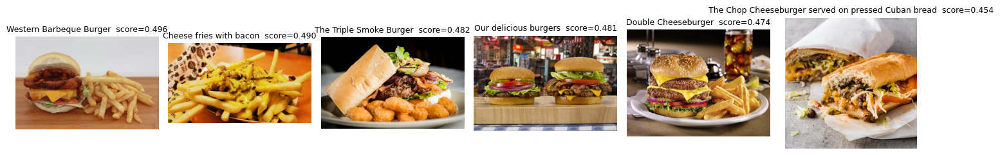

--- image-only (CLIP) ---


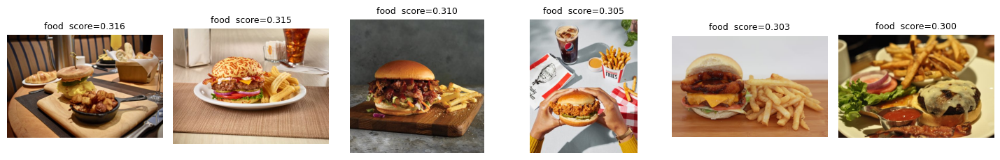

--- hybrid (RRF fusion) ---


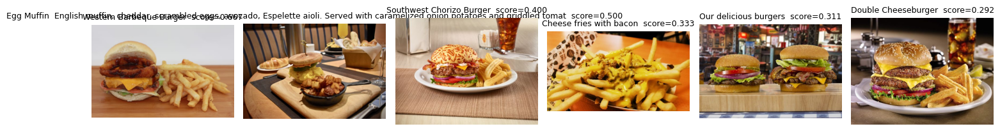


=== query='cozy restaurant interior with warm lighting' ===
--- text-only (caption embedding) ---


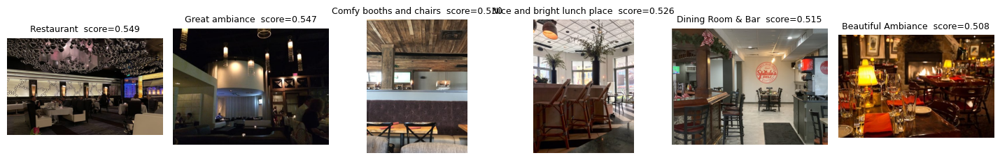

--- image-only (CLIP) ---


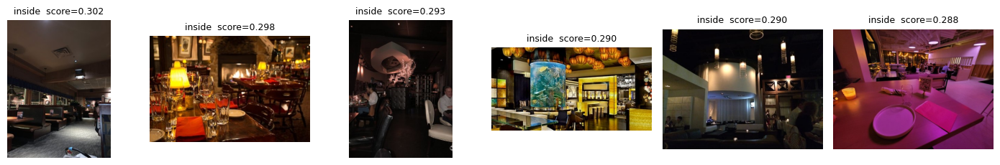

--- hybrid (RRF fusion) ---


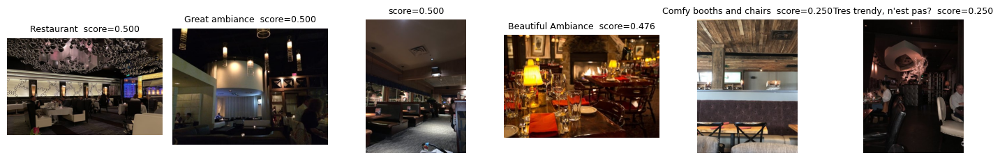


=== query='outdoor seating with string lights at night' ===
--- text-only (caption embedding) ---


) missing from font(s) DejaVu Sans.x2f7r0000gn/T/ipykernel_1604/229072732.py:25: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.assistant/.venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


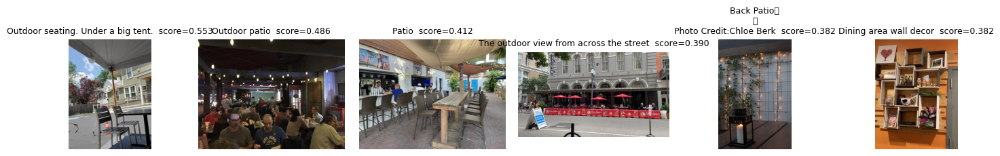

--- image-only (CLIP) ---


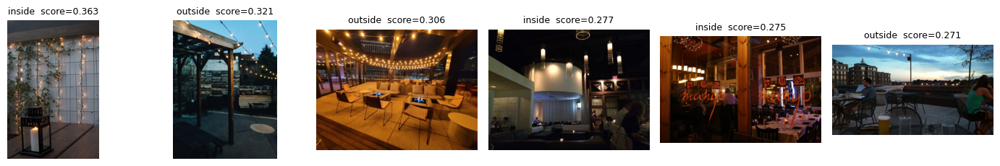

--- hybrid (RRF fusion) ---


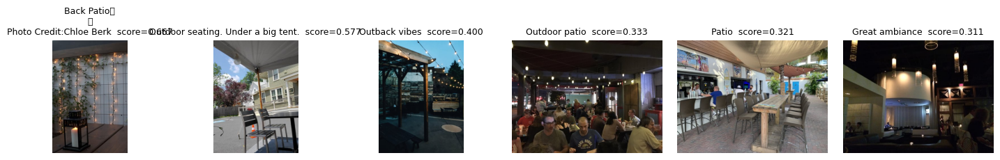


=== query='a glass of red wine' ===
--- text-only (caption embedding) ---


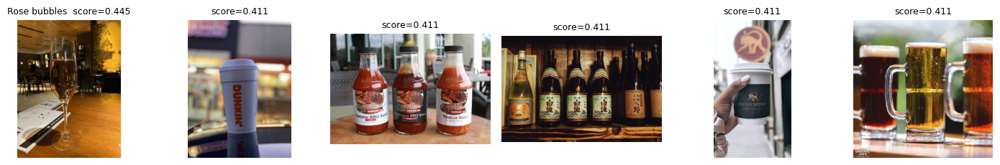

--- image-only (CLIP) ---


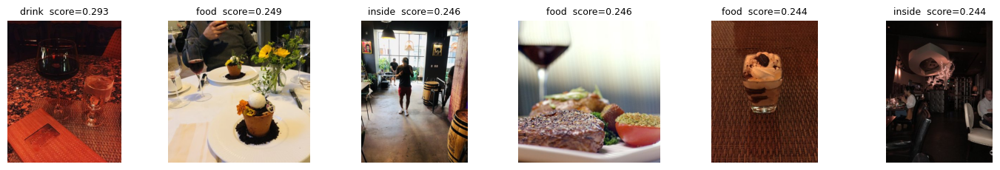

--- hybrid (RRF fusion) ---


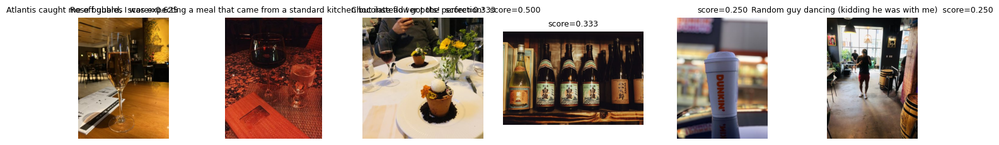


=== query='heated patio' ===
--- text-only (caption embedding) ---


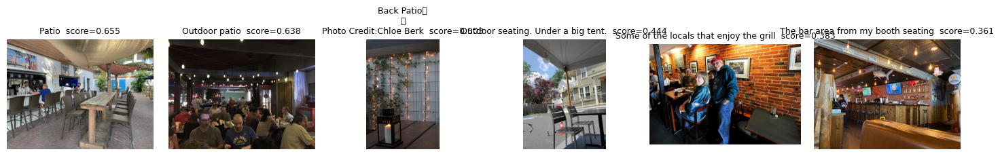

--- image-only (CLIP) ---


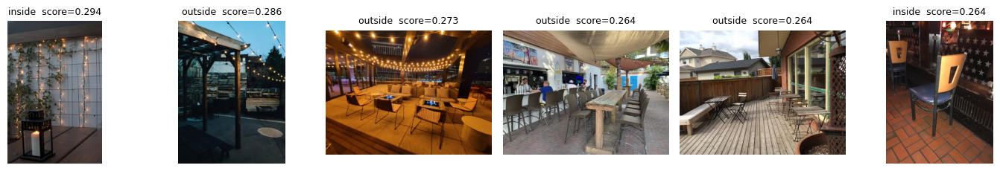

--- hybrid (RRF fusion) ---


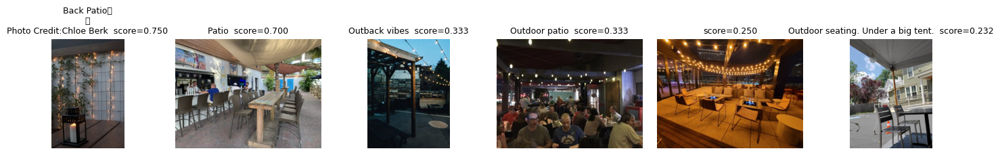

In [11]:
DEMO_QUERIES = [
    "a juicy burger with fries on a wooden table",
    "cozy restaurant interior with warm lighting",
    "outdoor seating with string lights at night",
    "a glass of red wine",
    "heated patio",
]

for q in DEMO_QUERIES:
    print(f"\n=== query={q!r} ===")
    print("--- text-only (caption embedding) ---")
    show_image_grid(search_text(q, top_k=6),   cols=6, title_field="caption", figsize_per=2.4)
    print("--- image-only (CLIP) ---")
    show_image_grid(search_image(q, top_k=6),  cols=6, title_field="label",   figsize_per=2.4)
    print("--- hybrid (RRF fusion) ---")
    show_image_grid(search_hybrid(q, top_k=6), cols=6, title_field="caption", figsize_per=2.4)

## 5. Scoping to the businesses the agent already chose

This is the shape we'll wire into the API: the agent first picks `N` restaurants via `get_formatted_context`, then asks the photos tool for the best photos **for those `business_id`s** given the user's query (or, if there's no clear visual intent, just a generic prompt like `"appetising restaurant photo"`).

Below we pick three random businesses from the indexed sample and pull their best "food" / "interior" matches.

Sample business_ids: ['Gb5nFcTgOBWeMrmCIbxqJA', 'cd-rz-piYMftZtbFU82x8g', 'RscMwBafa1cZh94tGlZT_Q'] 


=== query='best looking dish'  scoped to 3 businesses ===


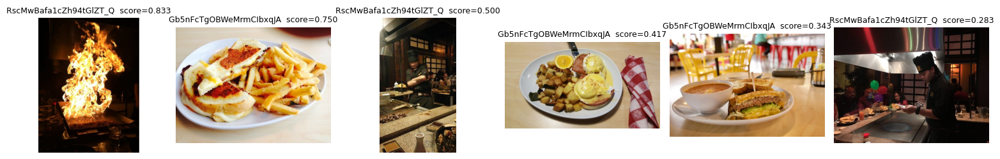


=== query='warm cozy interior'  scoped to 3 businesses ===


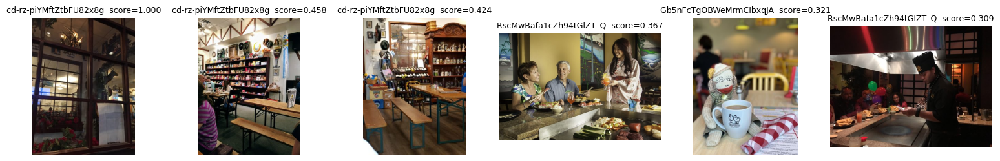


=== query='patio seating'  scoped to 3 businesses ===


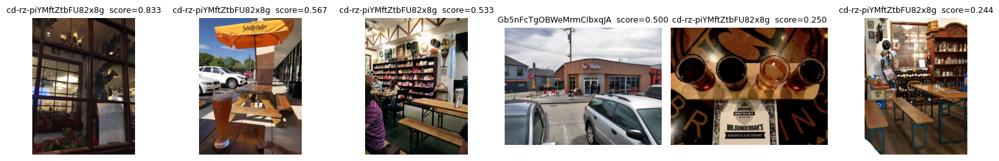

In [12]:
indexed_business_ids = (
    indexable.groupby("business_id").size().sort_values(ascending=False).head(50).index.tolist()
)
random.seed(7)
sample_business_ids = random.sample(indexed_business_ids, k=min(3, len(indexed_business_ids)))

print("Sample business_ids:", sample_business_ids, "\n")

for q in ["best looking dish", "warm cozy interior", "patio seating"]:
    print(f"\n=== query={q!r}  scoped to {len(sample_business_ids)} businesses ===")
    rows = search_hybrid(q, top_k=6, business_ids=sample_business_ids)
    if not rows:
        print("(no photos returned)")
        continue
    show_image_grid(rows, cols=6, title_field="business_id", figsize_per=2.6)